1 Perform Exploratory Data Analysis (EDA) on the data-set given below. Consider Salary as a target variable


2 Import the data and display the head, shape and description of the data.

In [2]:
# Import necessary libraries
import pandas as pd

# Load the dataset
data = pd.read_csv('C:\\Users\\ABCD\\Downloads\\data.xlsx - Sheet1.csv')

# Display the first few rows of the dataset
print("Head of the dataset:")
print(data.head())

# Display the shape of the dataset
print("\nShape of the dataset:")
print(data.shape)

# Display the description of the dataset
print("\nDescription of the dataset:")
print(data.describe(include='all'))  # 'include="all"' to describe all columns including categorical


Head of the dataset:
  Unnamed: 0      ID     Salary          DOJ          DOL  \
0      train  203097   420000.0  6/1/12 0:00      present   
1      train  579905   500000.0  9/1/13 0:00      present   
2      train  810601   325000.0  6/1/14 0:00      present   
3      train  267447  1100000.0  7/1/11 0:00      present   
4      train  343523   200000.0  3/1/14 0:00  3/1/15 0:00   

                Designation    JobCity Gender           DOB  10percentage  \
0   senior quality engineer  Bangalore      f  2/19/90 0:00          84.3   
1         assistant manager     Indore      m  10/4/89 0:00          85.4   
2          systems engineer    Chennai      f   8/3/92 0:00          85.0   
3  senior software engineer    Gurgaon      m  12/5/89 0:00          85.6   
4                       get    Manesar      m  2/27/91 0:00          78.0   

   ... ComputerScience  MechanicalEngg  ElectricalEngg TelecomEngg  CivilEngg  \
0  ...              -1              -1              -1          -1  

Step - 3 Univariate Analysis -> PDF, Histograms, Boxplots, Countplots, etc..
      


1. Univariate Analysis of Numerical Variables

1.1 Histogram and PDFs

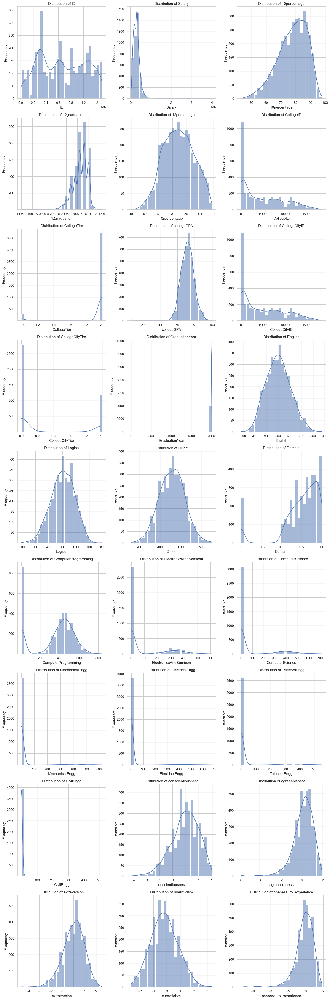

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set the style for the plots
sns.set(style="whitegrid")

# List of numerical columns
numerical_columns = data.select_dtypes(include=['float64', 'int64']).columns

# Calculate number of subplots needed
n = len(numerical_columns)
ncols = 3  # Number of columns for subplots
nrows = np.ceil(n / ncols).astype(int)  # Calculate required rows

# Plotting histograms and PDFs for each numerical variable
plt.figure(figsize=(15, 5 * nrows))
for i, col in enumerate(numerical_columns):
    plt.subplot(nrows, ncols, i + 1)
    sns.histplot(data[col], kde=True, bins=30)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


1.2 Boxplots for Outlier Detection


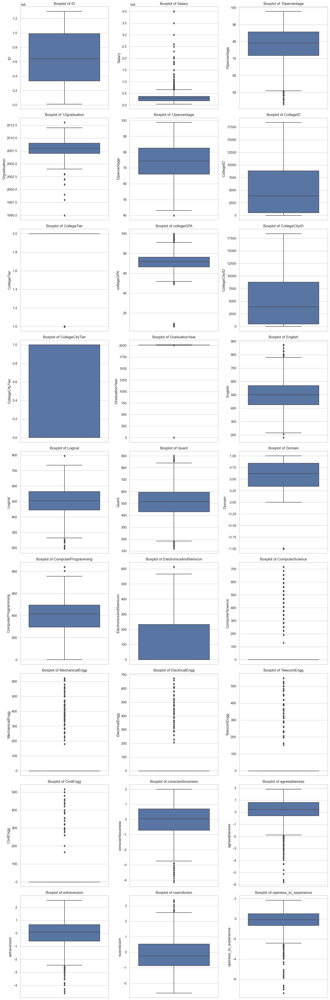

In [4]:
# Plotting boxplots for outlier detection
plt.figure(figsize=(15, 5 * nrows))
for i, col in enumerate(numerical_columns):
    plt.subplot(nrows, ncols, i + 1)
    sns.boxplot(y=data[col])
    plt.title(f'Boxplot of {col}')

plt.tight_layout()
plt.show()


2.Univariate Analysis of Categorical Variables

2.1. Countplots for Categorical Variables

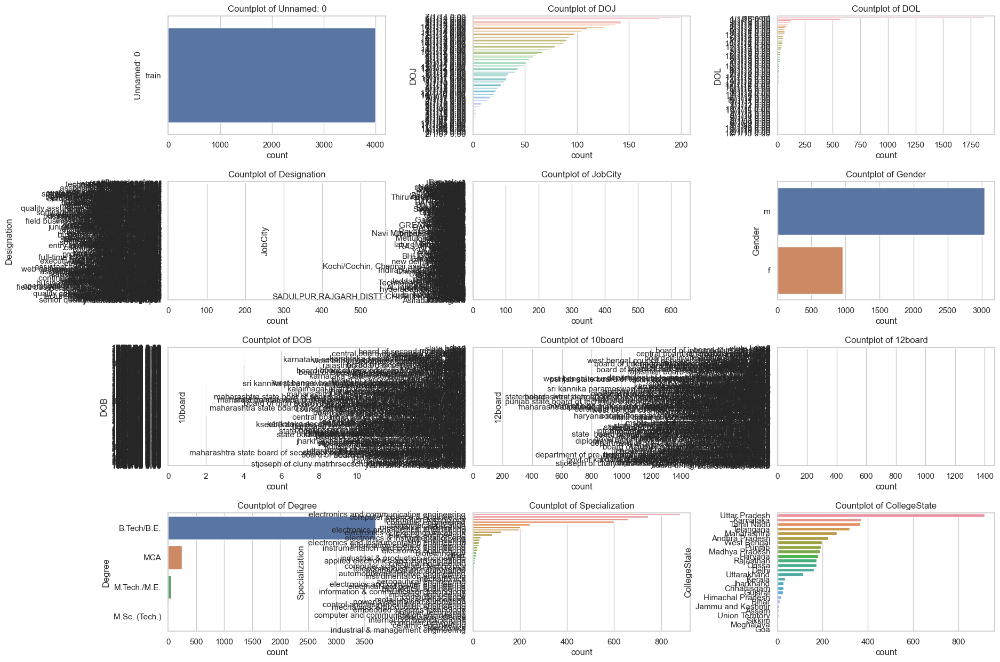

In [5]:
# List of categorical columns
categorical_columns = data.select_dtypes(include=['object', 'category']).columns

# Increase the figure size
plt.figure(figsize=(20, 15))

# Plotting countplots for each categorical variable
for i, col in enumerate(categorical_columns):
    plt.subplot(4, 3, i + 1)
    sns.countplot(y=data[col], order=data[col].value_counts().index)
    plt.title(f'Countplot of {col}')

# Adjust spacing between plots
plt.subplots_adjust(hspace=0.4, wspace=0.4)

# Show the plot
plt.show()

Step 4: Bivariate Analysis

1.Relationships Between Numerical Columns

1.1 **Scatter Plots**




In [6]:
# Display the columns
print("Columns in the DataFrame:")
print(data.columns.tolist())

# Alternatively, you can use info() for more detailed information
print("\nDataFrame Info:")
data.info()

Columns in the DataFrame:
['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity', 'Gender', 'DOB', '10percentage', '10board', '12graduation', '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree', 'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier', 'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant', 'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg', 'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion', 'nueroticism', 'openess_to_experience']

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             3998 non-null   object 
 1   ID                     3998 non-null   int64  
 2   Salary                 3998 non-null   float64
 3   DOJ                  

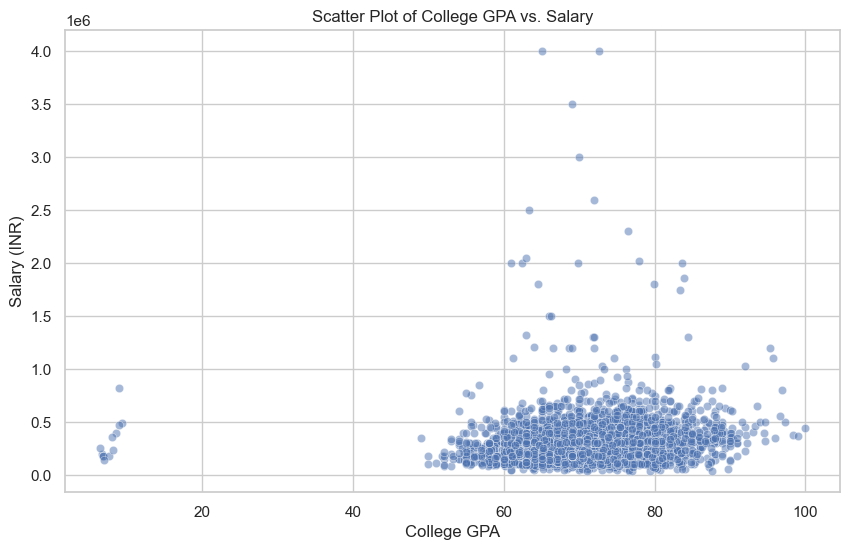

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style for the plots
sns.set(style="whitegrid")

# Scatter plot between collegeGPA and Salary
plt.figure(figsize=(10, 6))
sns.scatterplot(x=data['collegeGPA'], y=data['Salary'], alpha=0.5)
plt.title('Scatter Plot of College GPA vs. Salary')
plt.xlabel('College GPA')
plt.ylabel('Salary (INR)')
plt.show()

1.2. Hexbin Plots

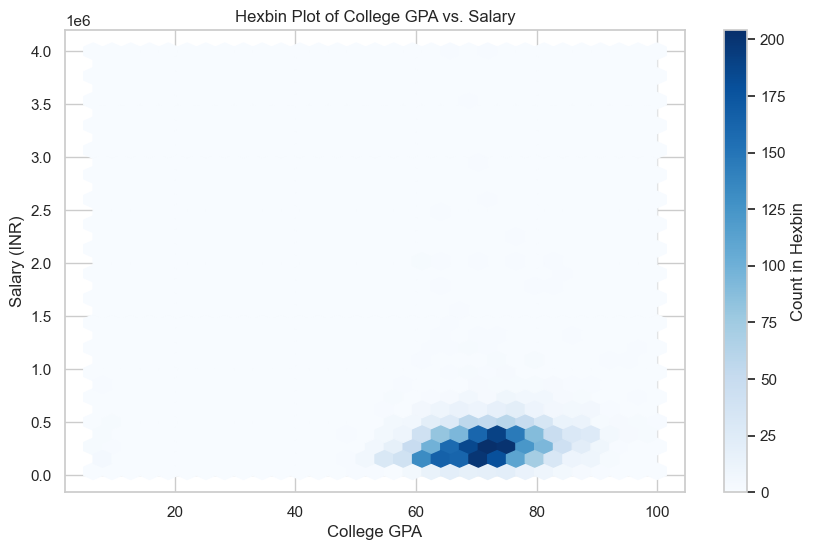

In [8]:
plt.figure(figsize=(10, 6))
plt.hexbin(data['collegeGPA'], data['Salary'], gridsize=30, cmap='Blues')
plt.colorbar(label='Count in Hexbin')
plt.title('Hexbin Plot of College GPA vs. Salary')
plt.xlabel('College GPA')
plt.ylabel('Salary (INR)')
plt.show()


1.3. Pair Plots


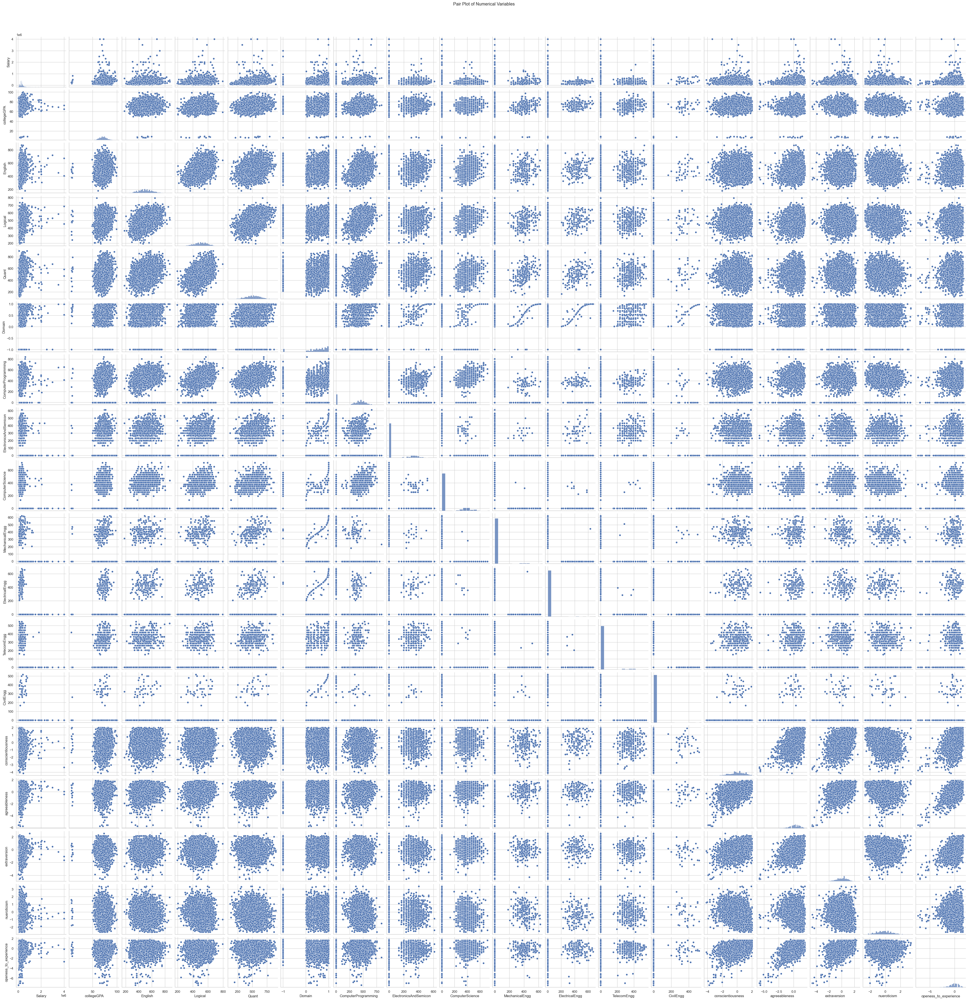

In [9]:
# Selecting a subset of numerical columns for the pair plot
subset_numerical_columns = data[['Salary', 'collegeGPA', 'English', 'Logical', 'Quant',
                                  'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
                                  'ComputerScience', 'MechanicalEngg', 'ElectricalEngg',
                                  'TelecomEngg', 'CivilEngg', 'conscientiousness',
                                  'agreeableness', 'extraversion', 'nueroticism',
                                  'openess_to_experience']]

sns.pairplot(subset_numerical_columns)
plt.suptitle('Pair Plot of Numerical Variables', y=1.02)
plt.show()

# 2.Patterns Between Categorical and Numerical Columns
       

2.1. Swarm Plots

C:\Users\ABCD\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 90.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\ABCD\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 34.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


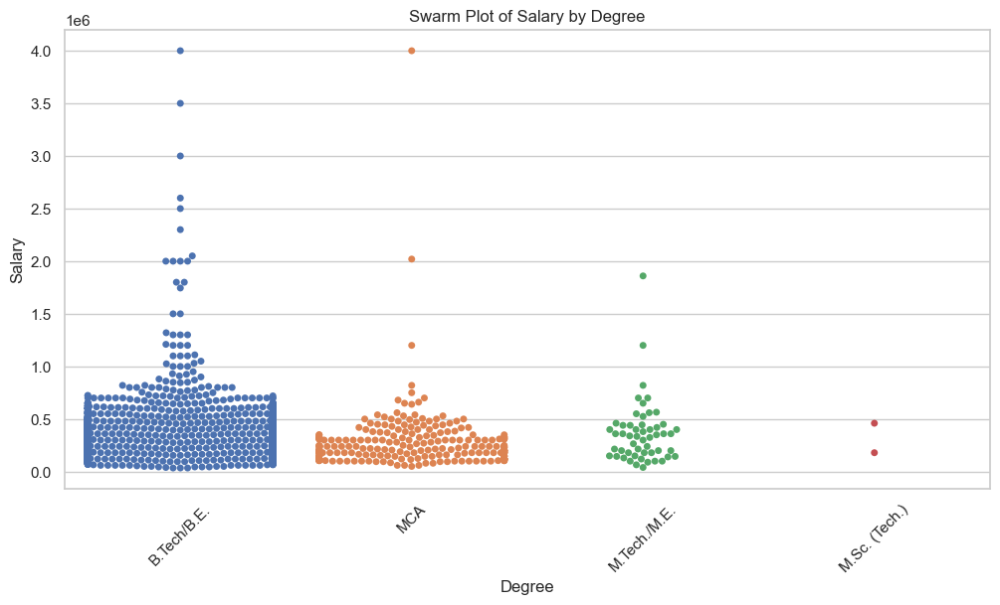

In [10]:
plt.figure(figsize=(12, 6))
sns.swarmplot(x='Degree', y='Salary', data=data)
plt.title('Swarm Plot of Salary by Degree')
plt.xticks(rotation=45)
plt.show()

2.2. Boxplots

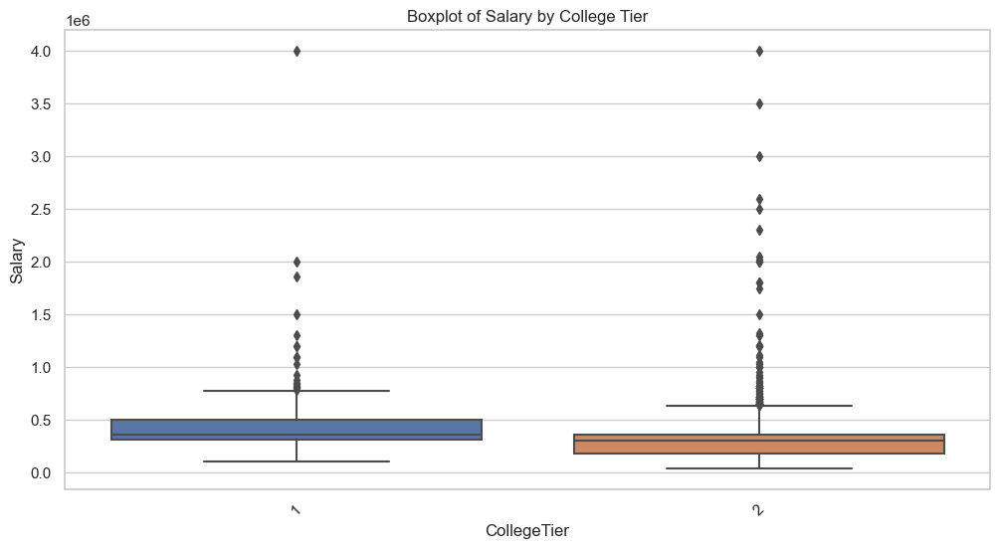

In [11]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='CollegeTier', y='Salary', data=data)
plt.title('Boxplot of Salary by College Tier')
plt.xticks(rotation=45)
plt.show()

2.3. Bar Plots

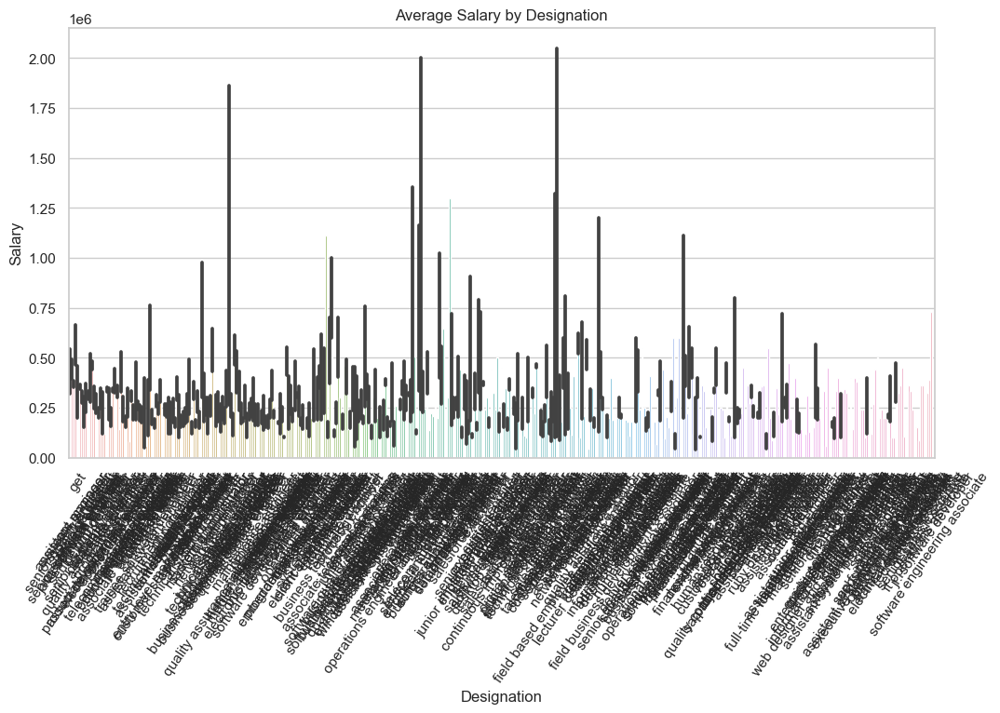

In [12]:
plt.figure(figsize=(12, 6))
sns.barplot(x='Designation', y='Salary', data=data)
plt.title('Average Salary by Designation')
plt.xticks(rotation=55)
plt.show()

3.Relationships Between Categorical Columns
  

3.1. Stacked Bar Plots

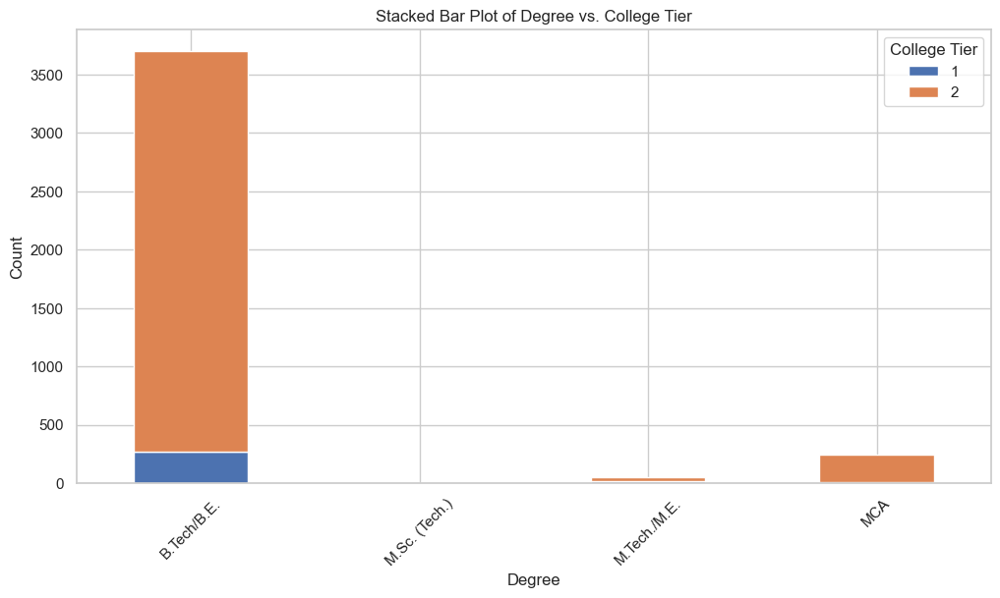

In [13]:
# Calculate counts for each combination of categorical variables
cross_tab = pd.crosstab(data['Degree'], data['CollegeTier'])

# Plotting the stacked bar plot
cross_tab.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title('Stacked Bar Plot of Degree vs. College Tier')
plt.xlabel('Degree')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='College Tier')
plt.show()

**Step - 5 - Research Questions**

To test the claim made in the Times of India article regarding the salary expectations for Computer Science Engineering graduates, we will analyze the dataset specifically focusing on the job titles mentioned (Programming Analyst, Software Engineer, Hardware Engineer, and Associate Engineer). The goal is to determine if the average salaries for these positions fall within the range of 2.5 to 3 lakhs (250,000 to 300,000 INR).

Step 5: Visualizing Salary Data

*   Filter the Data: Extract data for the specified job titles.
*   Calculate the Average Salary: Determine the average salary for these positions.

*   Visualize with a Bar Plot: Create a bar plot to show the average salaries and the claimed salary range.






In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

# Filter the data for the specified job titles
job_titles = ['Programming Analyst', 'Software Engineer', 'Hardware Engineer', 'Associate Engineer']
filtered_data = data[data['Designation'].isin(job_titles)]

# Check if filtered data is empty
if filtered_data.empty:
    print("Filtered data is empty. Please check the data and job titles.")
else:
    # Calculate the average salary for these job titles
    average_salary = filtered_data.groupby('Designation')['Salary'].mean().reset_index()

    # Check if average_salary has valid data
    if average_salary.empty:
        print("No data available for the selected job titles.")
    else:
        # Create a bar plot for average salaries
        plt.figure(figsize=(10, 6))
        sns.barplot(x='Designation', y='Salary', data=average_salary, palette='viridis')

        # Add title and labels
        plt.title('Average Salary for Computer Science Engineering Graduates')
        plt.xlabel('Job Title')
        plt.ylabel('Average Salary (INR)')

        # Add horizontal lines for claimed salary ranges
        plt.axhline(250000, color='red', linestyle='--', label='Claimed Min Salary (2.5 Lakhs)')
        plt.axhline(300000, color='orange', linestyle='--', label='Claimed Max Salary (3 Lakhs)')

        # Add legend
        plt.legend()

        # Rotate x-axis labels for better readability
        plt.xticks(rotation=45)

        # Show plot
        plt.tight_layout()
        plt.show()

  

Filtered data is empty. Please check the data and job titles.


Is there a relationship between gender and specialization? (i.e. Does the preference of Specialisation depend on the Gender?)

Steps to Analyze the Relationship Between Gender and Specialization


1.  Create a Cross Tabulation: Count the occurrences of each specialization for each gender.
2.   Visualize the Data: Use a stacked bar plot to visualize the relationship.





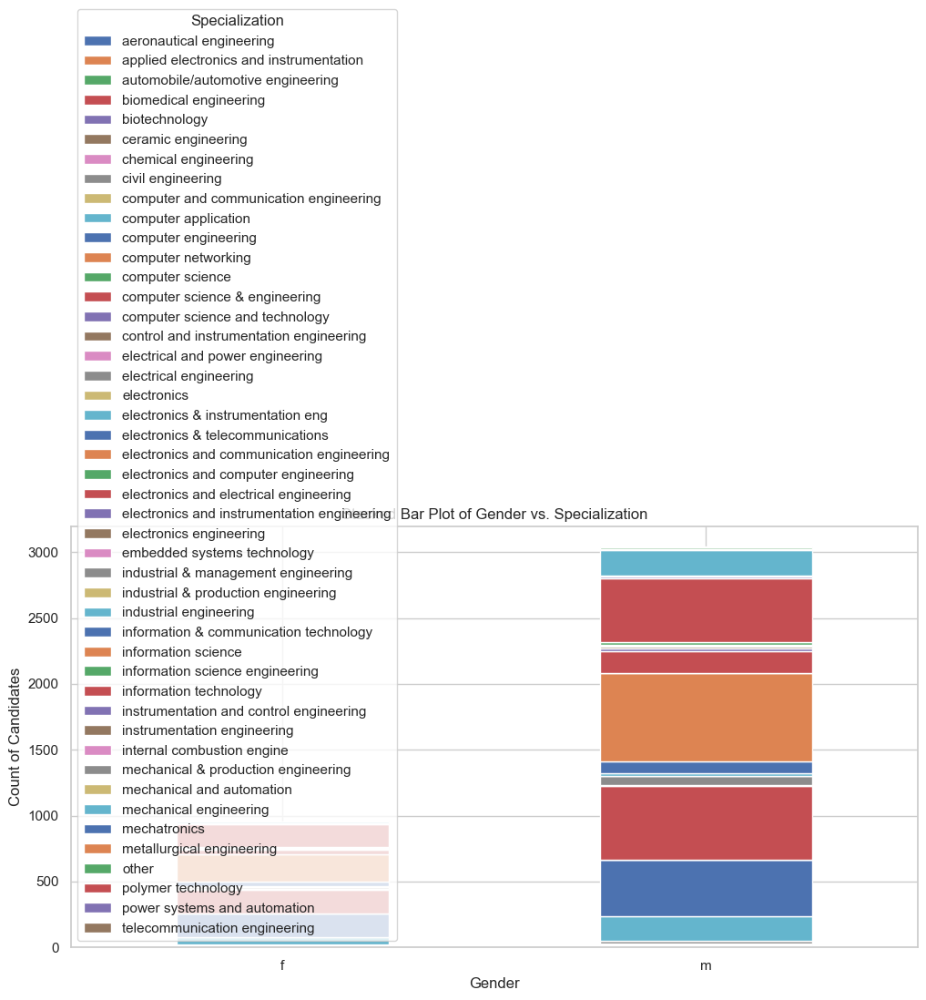

In [17]:
import pandas as pd
import matplotlib.pyplot as plt

# Create a cross-tabulation of Gender and Specialization
cross_tab = pd.crosstab(data['Gender'], data['Specialization'])

# Plotting the stacked bar plot
cross_tab.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title('Stacked Bar Plot of Gender vs. Specialization')
plt.xlabel('Gender')
plt.ylabel('Count of Candidates')
plt.xticks(rotation=0)
plt.legend(title='Specialization')
plt.show()


Conclusion : Research Questions

Q1- What is the Impact of College Tier on Salary?


**Steps to Analyze the Impact of College Tier on Salary**

1.   Visualize Salary Distribution by College Tier: Use a box plot.
2.   Calculate Average Salary by College Tier: Use groupby to find the mean.
3.  Perform ANOVA Test: To check if the differences in means are significant.










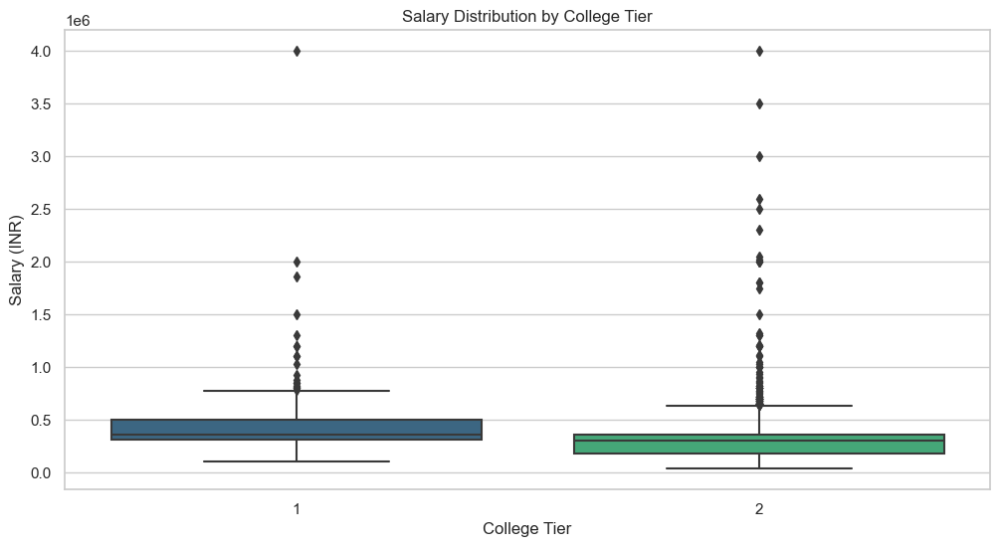

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style for the plots
sns.set(style="whitegrid")

# Create a box plot for Salary by College Tier
plt.figure(figsize=(12, 6))
sns.boxplot(x='CollegeTier', y='Salary', data=data, palette='viridis')
plt.title('Salary Distribution by College Tier')
plt.xlabel('College Tier')
plt.ylabel('Salary (INR)')
plt.xticks(rotation=0)
plt.show()


In [19]:
# Calculate the average salary for each college tier
average_salary_by_tier = data.groupby('CollegeTier')['Salary'].mean().reset_index()
average_salary_by_tier.columns = ['College Tier', 'Average Salary']

# Display the average salary by college tier
print(average_salary_by_tier)

   College Tier  Average Salary
0             1   442356.902357
1             2   296893.812483


In [20]:
# Check the column names in your dataset
print(data.columns)

Index(['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')


In [21]:
# Correct column name usage
data['Salary']

0        420000.0
1        500000.0
2        325000.0
3       1100000.0
4        200000.0
          ...    
3993     280000.0
3994     100000.0
3995     320000.0
3996     200000.0
3997     400000.0
Name: Salary, Length: 3998, dtype: float64

In [22]:
from scipy import stats

# Remove missing values for the relevant columns (if any)
anova_data = data[['Salary', 'CollegeTier']].dropna()

# Group the data by CollegeTier
groups = [anova_data[anova_data['CollegeTier'] == tier]['Salary'] for tier in anova_data['CollegeTier'].unique()]

# Perform the one-way ANOVA test
anova_result = stats.f_oneway(*groups)

# Display the ANOVA test results
print(f"ANOVA F-statistic: {anova_result.statistic}")
print(f"p-value: {anova_result.pvalue}")

# Interpretation
if anova_result.pvalue < 0.05:
    print("There is a statistically significant difference in mean salaries across different college tiers.")
else:
    print("There is no statistically significant difference in mean salaries across different college tiers.")


ANOVA F-statistic: 132.78163916226222
p-value: 3.018247144438326e-30
There is a statistically significant difference in mean salaries across different college tiers.


Q2-How do Personality Traits Affect Salary Outcomes?

**Steps to Analyze the Impact of Personality Traits on Salary**
1. Visualizing the Relationship
We can create scatter plots with a regression line to visualize how salary varies with each personality trait score.

2. Calculating Correlation Coefficients
This will provide insights into the strength and direction of the relationships.

3. Performing Regression Analysis (Optional)
You can use linear regression to model the relationship.





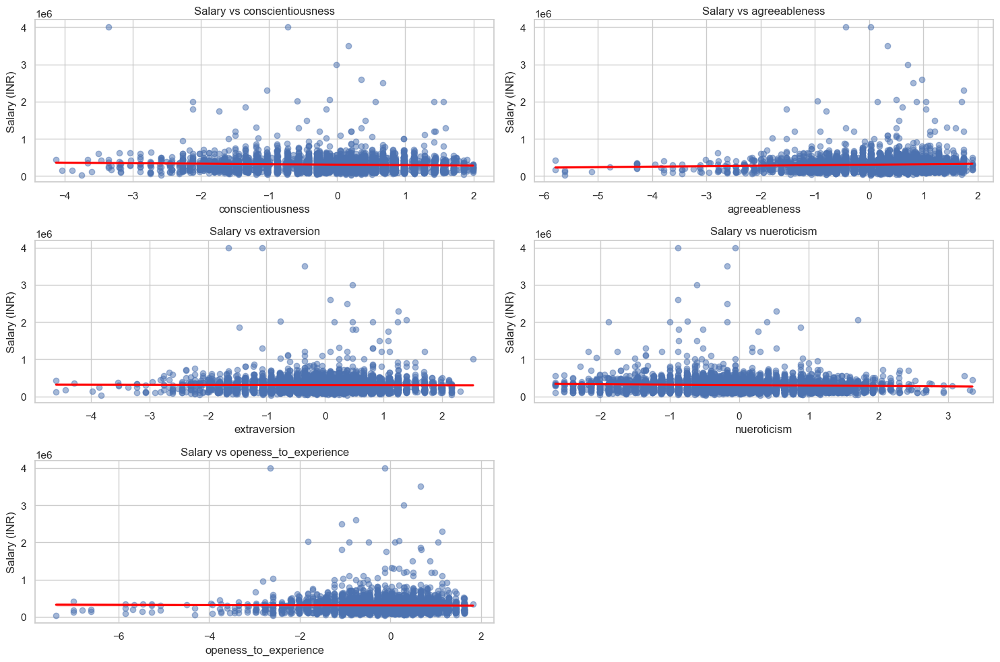

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'data' is your DataFrame and it has already been loaded

# Personality traits in the dataset (Corrected column names)
personality_traits = ['conscientiousness', 'agreeableness', 'extraversion', 'nueroticism', 'openess_to_experience']

# Set the plot style
sns.set(style="whitegrid")

# Plot scatter plots with regression lines
plt.figure(figsize=(15, 10))
for i, trait in enumerate(personality_traits):
    plt.subplot(3, 2, i + 1)
    sns.regplot(x=trait, y='Salary', data=data, scatter_kws={'alpha': 0.5}, line_kws={"color": "red"})
    plt.title(f'Salary vs {trait}')
    plt.xlabel(trait)
    plt.ylabel('Salary (INR)')

plt.tight_layout()
plt.show()


In [24]:
# Assuming 'data' is your DataFrame and it has already been loaded

# Personality traits in the dataset (Corrected column names)
personality_traits = ['conscientiousness', 'agreeableness', 'extraversion', 'nueroticism', 'openess_to_experience']

# Calculate the correlation between each personality trait and Salary
correlations = data[personality_traits + ['Salary']].corr()['Salary'].drop('Salary')

# Display correlation coefficients
print("Correlation Coefficients between Personality Traits and Salary:")
print(correlations)


Correlation Coefficients between Personality Traits and Salary:
conscientiousness       -0.064148
agreeableness            0.057423
extraversion            -0.010213
nueroticism             -0.054685
openess_to_experience   -0.011312
Name: Salary, dtype: float64


In [25]:
import statsmodels.api as sm

# Assuming 'data' is your DataFrame and it has already been loaded

# Personality traits in the dataset (Corrected column names)
personality_traits = ['conscientiousness', 'agreeableness', 'extraversion', 'nueroticism', 'openess_to_experience']

# Define the independent variables (personality traits) and dependent variable (Salary)
X = data[personality_traits]
y = data['Salary']

# Add a constant term to the model (intercept)
X = sm.add_constant(X)

# Fit the regression model
model = sm.OLS(y, X).fit()

# Display the regression summary
print(model.summary())
import statsmodels.api as sm

# Assuming 'data' is your DataFrame and it has already been loaded

# Personality traits in the dataset (Corrected column names)
personality_traits = ['conscientiousness', 'agreeableness', 'extraversion', 'nueroticism', 'openess_to_experience']

# Define the independent variables (personality traits) and dependent variable (Salary)
X = data[personality_traits]
y = data['Salary']

# Add a constant term to the model (intercept)
X = sm.add_constant(X)

# Fit the regression model
model = sm.OLS(y, X).fit()

# Display the regression summary
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:                 Salary   R-squared:                       0.021
Model:                            OLS   Adj. R-squared:                  0.020
Method:                 Least Squares   F-statistic:                     17.13
Date:                Thu, 03 Oct 2024   Prob (F-statistic):           8.32e-17
Time:                        22:53:02   Log-Likelihood:                -54677.
No. Observations:                3998   AIC:                         1.094e+05
Df Residuals:                    3992   BIC:                         1.094e+05
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                  2.985e+

Q3-To explore whether there is a gender bias in designation or salary, we can perform the following analysis:

 Steps:


1. Visualization:


*   Use boxplots and violin plots to visualize salary distribution by gender.

*   Use count plots to show the distribution of designations by gender


2.  Statistical Testing:


*   Perform a t-test to determine if there is a statistically significant difference in salary between genders.
*   Use a chi-square test to check if there is an association between gender and designation.



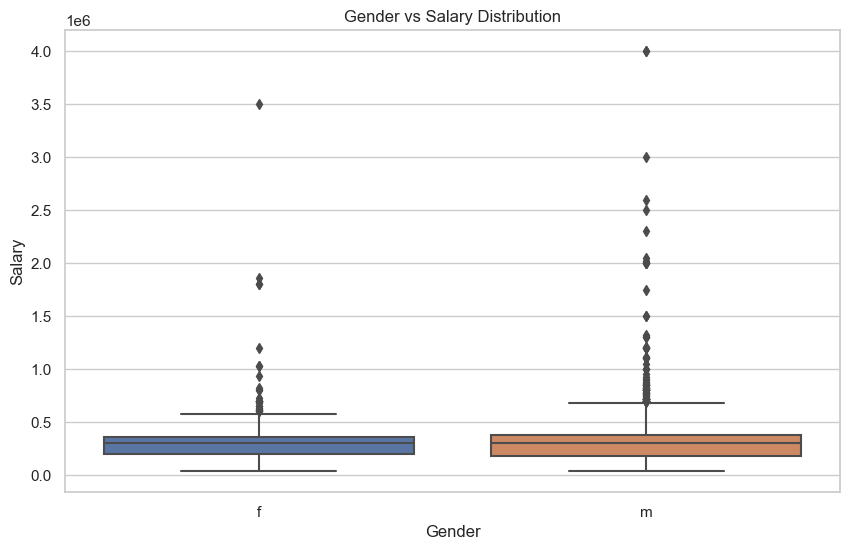

In [26]:
# 1. Visualization: Gender vs. Salary Distribution
import seaborn as sns
import matplotlib.pyplot as plt

# Gender vs Salary Boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(x='Gender', y='Salary', data=data)
plt.title('Gender vs Salary Distribution')
plt.show()

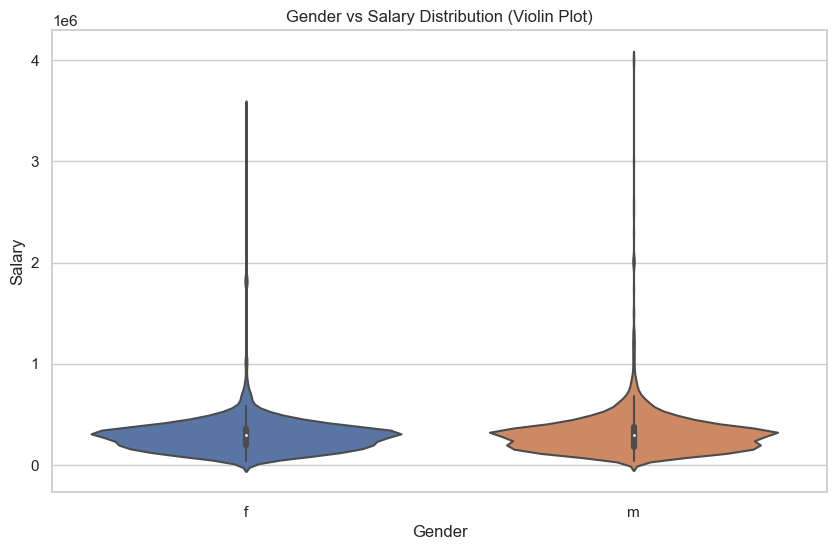

In [27]:
# Gender vs Salary Violin Plot
plt.figure(figsize=(10, 6))
sns.violinplot(x='Gender', y='Salary', data=data)
plt.title('Gender vs Salary Distribution (Violin Plot)')
plt.show()

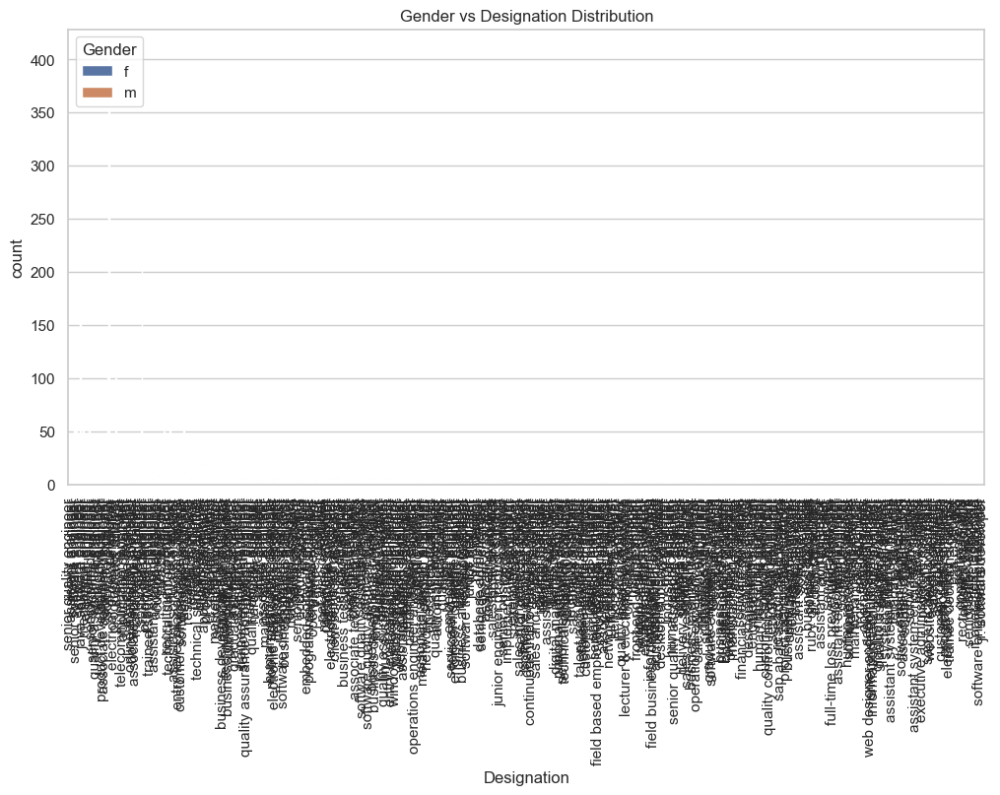

In [28]:
# 2. Visualization: Gender vs. Designation Distribution
# Countplot of Designation by Gender
plt.figure(figsize=(12, 6))
sns.countplot(x='Designation', hue='Gender', data=data)
plt.title('Gender vs Designation Distribution')
plt.xticks(rotation=90)  # Rotate x labels for better readability
plt.show()

In [29]:
#  Statistical Testing: T-test for Gender and Salary
from scipy import stats

# Separate salary data by gender
male_salaries = data[data['Gender'] == 'Male']['Salary']
female_salaries = data[data['Gender'] == 'Female']['Salary']

# Perform t-test
t_stat, p_value = stats.ttest_ind(male_salaries, female_salaries, nan_policy='omit')

# Output results
print(f"T-statistic: {t_stat}")
print(f"P-value: {p_value}")

if p_value < 0.05:
    print("There is a significant difference in salaries between genders.")
else:
    print("No significant difference in salaries between genders.")


T-statistic: nan
P-value: nan
No significant difference in salaries between genders.


In [30]:
from scipy.stats import chi2_contingency

# Create a contingency table for Gender and Designation
contingency_table = pd.crosstab(data['Gender'], data['Designation'])

# Perform chi-square test
chi2, p, dof, expected = chi2_contingency(contingency_table)

# Output results
print(f"Chi-square statistic: {chi2}")
print(f"P-value: {p}")

if p < 0.05:
    print("There is a significant association between gender and designation.")
else:
    print("No significant association between gender and designation.")


Chi-square statistic: 526.8691881586136
P-value: 0.00022988162224264305
There is a significant association between gender and designation.


Q4-What Specializations Are Most Popular Among Different Genders?


Steps:

*   Visualization:
Use count plots to visualize the distribution of specializations by gender.

* Statistical Testing:
Perform a chi-square test to check if there is an association between gender and specialization.

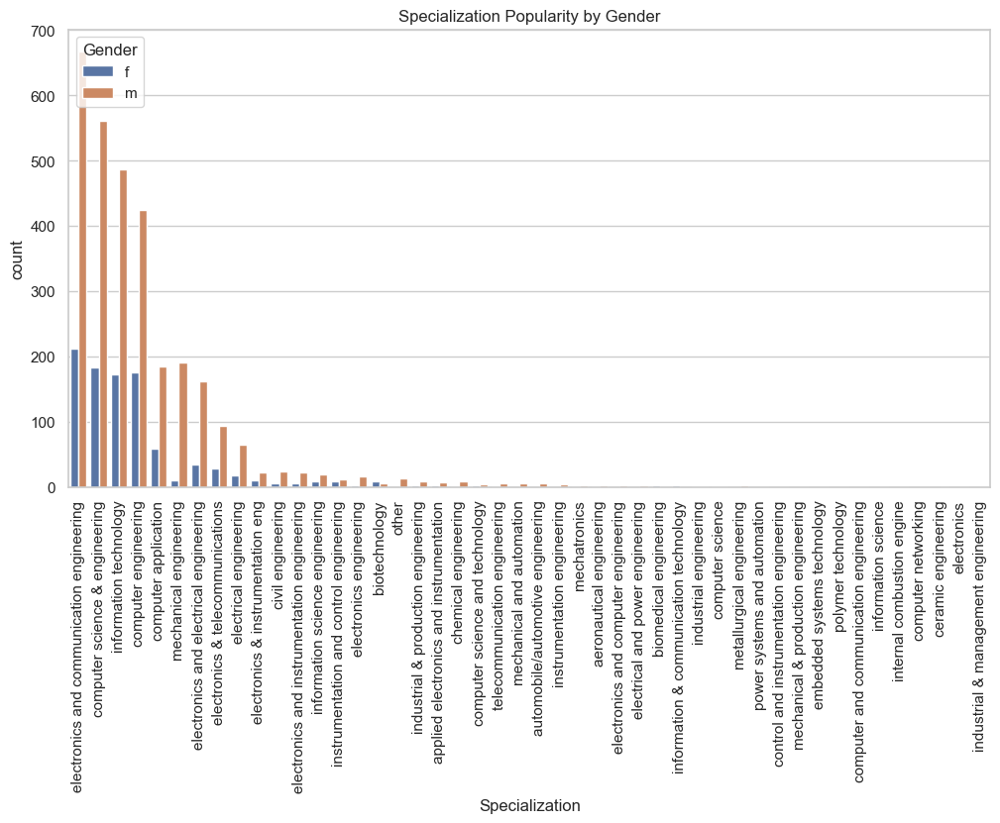

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt

# Countplot of Specialization by Gender
plt.figure(figsize=(12, 6))
sns.countplot(x='Specialization', hue='Gender', data=data, order=data['Specialization'].value_counts().index)
plt.title('Specialization Popularity by Gender')
plt.xticks(rotation=90)  # Rotate x labels for better readability
plt.show()


In [32]:
from scipy.stats import chi2_contingency

# Create a contingency table for Gender and Specialization
contingency_table = pd.crosstab(data['Gender'], data['Specialization'])

# Perform chi-square test
chi2, p, dof, expected = chi2_contingency(contingency_table)

# Output results
print(f"Chi-square statistic: {chi2}")
print(f"P-value: {p}")

if p < 0.05:
    print("There is a significant association between gender and specialization.")
else:
    print("No significant association between gender and specialization.")


Chi-square statistic: 104.46891913608455
P-value: 1.2453868176976918e-06
There is a significant association between gender and specialization.


Q5-What is the Relationship Between Academic Performance and Job Outcomes?

Steps to Analyze:
Data Visualization:



*  Use scatter plots to visualize the relationship between different academic performance metrics (e.g., grades, GPA, test scores) and job outcomes (e.g., salary).
* Use boxplots to compare salary distributions across different designations and academic performance levels.  


Statistical Analysis:



* Calculate correlation coefficients between academic performance metrics and salary.
*  Optionally, perform regression analysis to model the relationship between academic performance and salary.




In [33]:
# Print all column names
print(data.columns.tolist())


['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity', 'Gender', 'DOB', '10percentage', '10board', '12graduation', '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree', 'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier', 'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant', 'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg', 'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion', 'nueroticism', 'openess_to_experience']


In [34]:
correct_college_gpa = 'collegeGPA'  # Update this to the actual name from the printout


In [35]:
# Check for null values in the specified columns
print(data[[correct_college_gpa, 'Salary']].isnull().sum())


collegeGPA    0
Salary        0
dtype: int64


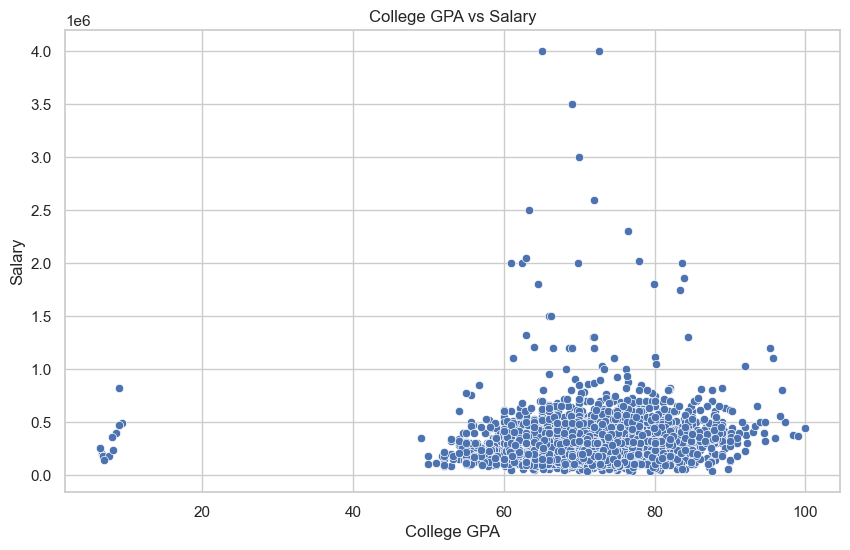

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt

# Ensure correct_college_gpa is set to the actual column name
correct_college_gpa = 'collegeGPA'  # Example; change this as per your DataFrame

# Create the scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=correct_college_gpa, y='Salary', data=data)
plt.title('College GPA vs Salary')
plt.xlabel('College GPA')
plt.ylabel('Salary')
plt.show()


In [37]:
# Strip whitespace from column names
data.columns = data.columns.str.strip()

In [38]:
print(data.columns.tolist())

['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity', 'Gender', 'DOB', '10percentage', '10board', '12graduation', '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree', 'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier', 'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant', 'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg', 'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion', 'nueroticism', 'openess_to_experience']


Columns in DataFrame:
['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity', 'Gender', 'DOB', '10percentage', '10board', '12graduation', '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree', 'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier', 'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant', 'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg', 'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion', 'nueroticism', 'openess_to_experience']


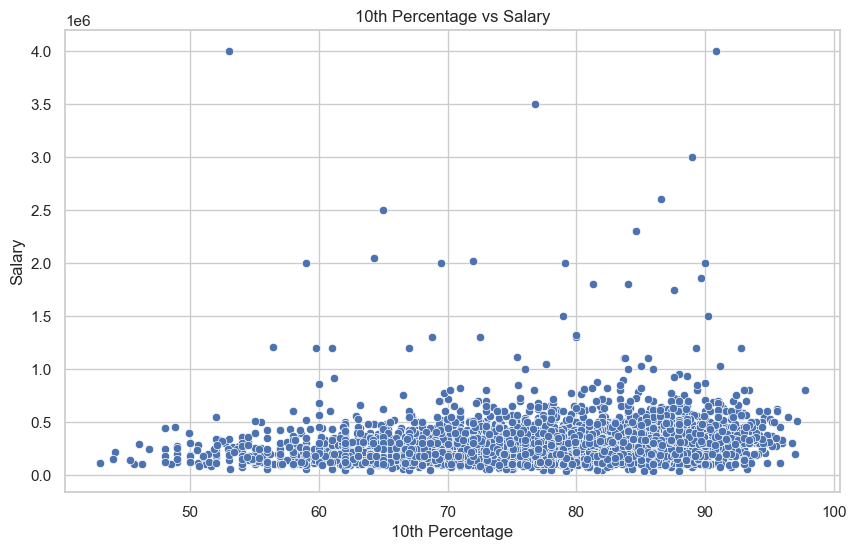

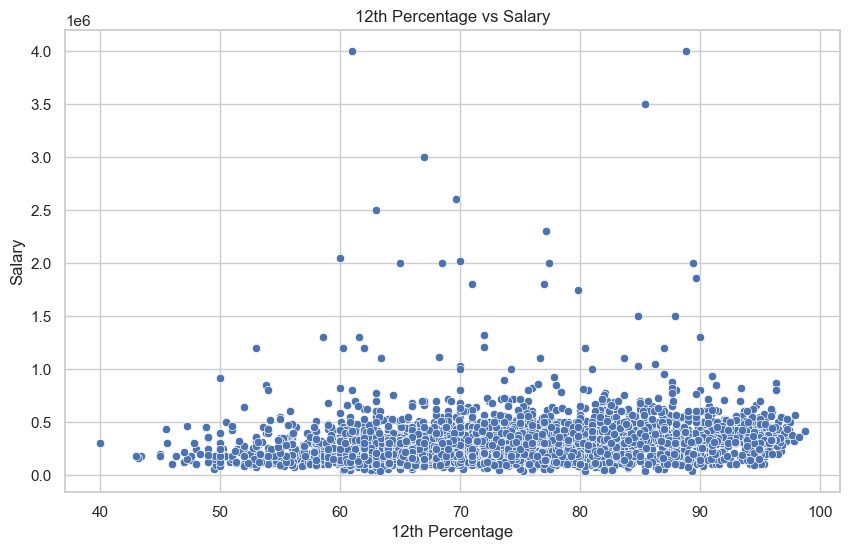

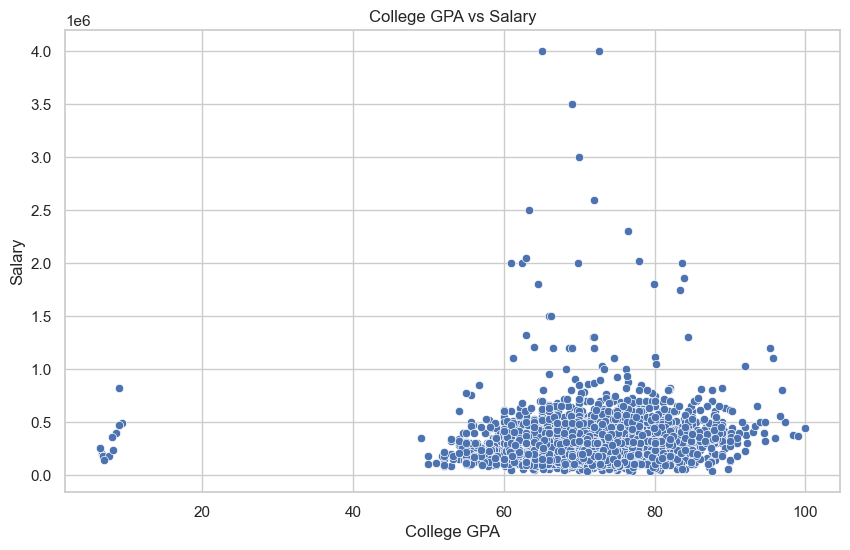

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt

# Ensure there are no leading or trailing spaces in column names
data.columns = data.columns.str.strip()

# Print the columns to verify names
print("Columns in DataFrame:")
print(data.columns.tolist())

# Visualize relationship between 10th percentage and Salary
plt.figure(figsize=(10, 6))
sns.scatterplot(x='10percentage', y='Salary', data=data)
plt.title('10th Percentage vs Salary')
plt.xlabel('10th Percentage')
plt.ylabel('Salary')
plt.show()

# Visualize relationship between 12th percentage and Salary
plt.figure(figsize=(10, 6))
sns.scatterplot(x='12percentage', y='Salary', data=data)
plt.title('12th Percentage vs Salary')
plt.xlabel('12th Percentage')
plt.ylabel('Salary')
plt.show()

# Visualize relationship between College GPA and Salary
# Use the actual column name for College GPA after verifying the DataFrame
# Assuming it might be something like 'collegeGPA' or 'College_GPA'
# Update this line based on the printed column names
plt.figure(figsize=(10, 6))
sns.scatterplot(x='collegeGPA', y='Salary', data=data)  # Adjust 'collegeGPA' as necessary
plt.title('College GPA vs Salary')
plt.xlabel('College GPA')
plt.ylabel('Salary')
plt.show()


<AxesSubplot:xlabel='collegeGPA', ylabel='Salary'>

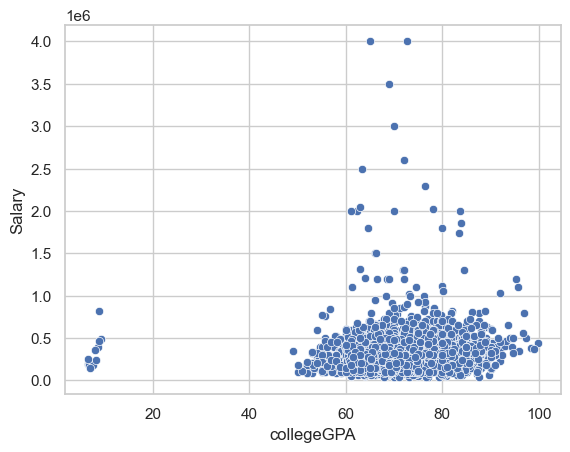

In [40]:
sns.scatterplot(x='collegeGPA', y='Salary', data=data)


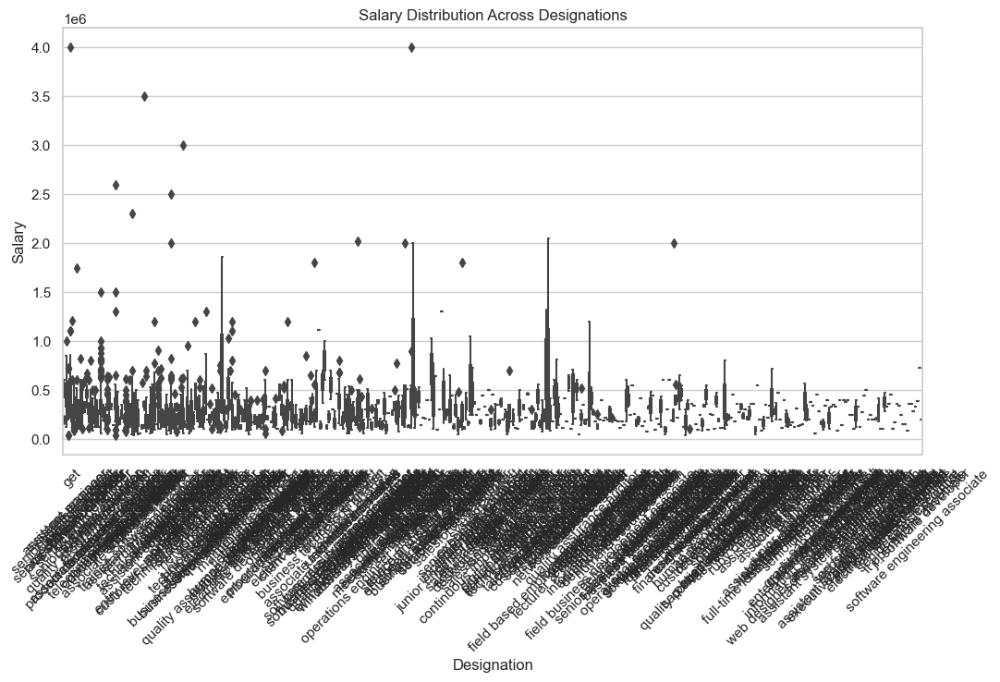

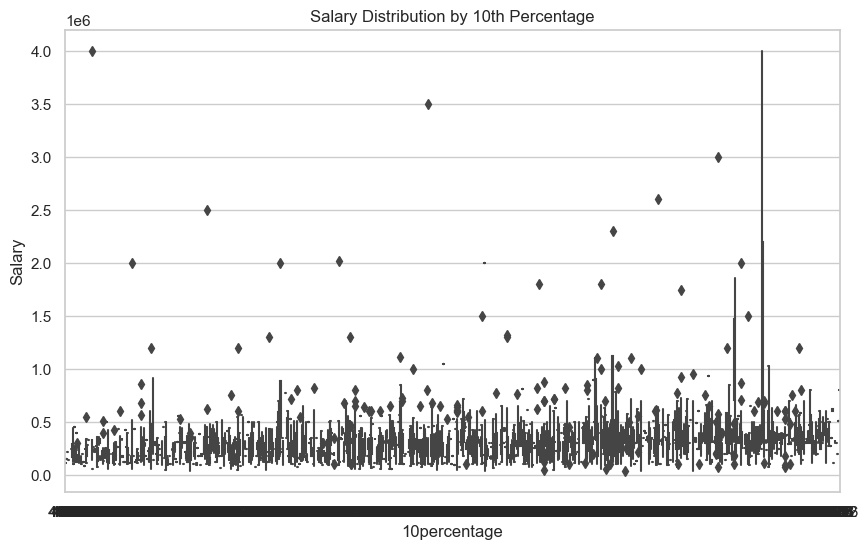

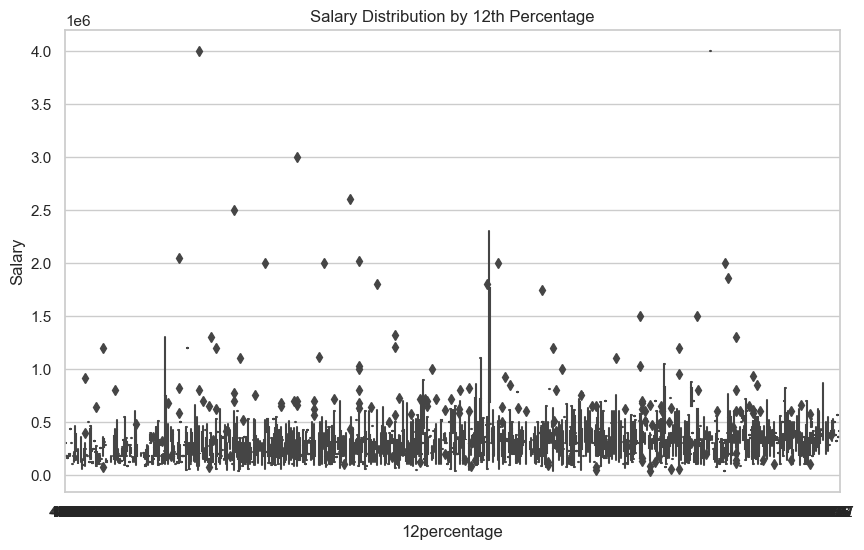

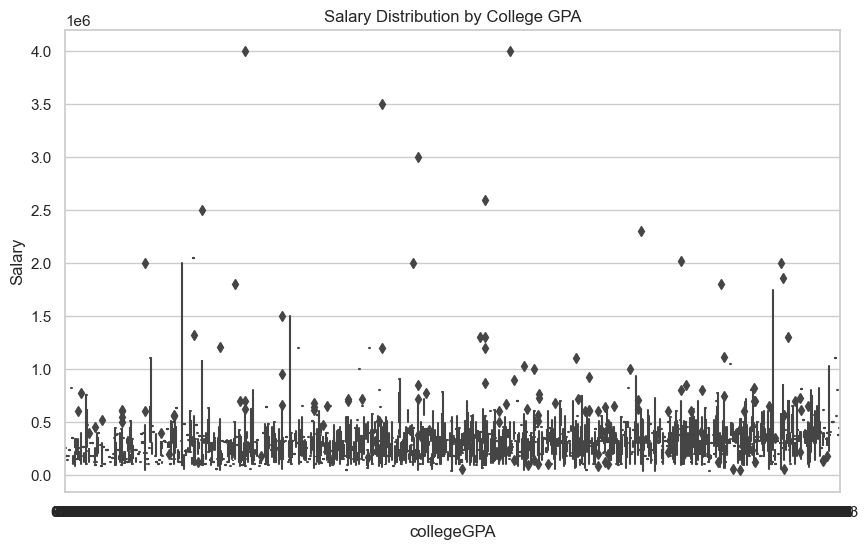

In [41]:
import seaborn as sns
import matplotlib.pyplot as plt

# Ensure there are no leading or trailing spaces in column names
data.columns = data.columns.str.strip()

# Boxplot for Salary distribution across Designation
plt.figure(figsize=(12, 6))
sns.boxplot(x='Designation', y='Salary', data=data)
plt.title('Salary Distribution Across Designations')
plt.xticks(rotation=45)  # Rotate x labels for better readability
plt.show()

# Boxplot for 10th Percentage and Salary
plt.figure(figsize=(10, 6))
sns.boxplot(x='10percentage', y='Salary', data=data)
plt.title('Salary Distribution by 10th Percentage')
plt.show()

# Boxplot for 12th Percentage and Salary
plt.figure(figsize=(10, 6))
sns.boxplot(x='12percentage', y='Salary', data=data)
plt.title('Salary Distribution by 12th Percentage')
plt.show()

# Boxplot for College GPA and Salary
# Ensure to use the correct column name for College GPA
plt.figure(figsize=(10, 6))
sns.boxplot(x='collegeGPA', y='Salary', data=data)  # Adjust 'collegeGPA' based on your actual column name
plt.title('Salary Distribution by College GPA')
plt.show()
